## import

In [1]:
!pip install category_encoders
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings(action='ignore')
plt.rc('font', family='NanumBarunGothic') 
mpl.rc('axes', unicode_minus=False)
plt.rcParams["font.family"] = 'nanummyeongjo'
plt.rcParams["axes.grid"] = True
plt.rcParams["figure.figsize"] = (12,6)
plt.rcParams["axes.formatter.useoffset"] = False
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams["axes.formatter.limits"] = -10000, 10000
%matplotlib inline
%config InlineBackend.figure_format='retina'

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fonts-nanum is already the newest version (20170925-1).
0 upgraded, 0 newly installed, 0 to remove and 39 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 10 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/var/cache/fontconfig: cleaning cache directory
/root/.cache/fontconfig: not cleaning non-existent cache directory
/root/.fontconfig: not cleaning non-existent cache directory
fc-cache: succeeded


# 1. Preparation

## 1.1 Load datasets

In [3]:
data = pd.read_csv('/content/drive/MyDrive/final_data (1).csv')
df = data.copy()
df = df.drop(columns=['Unnamed: 0','거래일'])
num_feature = ['세대','인구','자동차등록','인구이동(전입지별)',
               '출생아수(명)', '사망자수(명)' ,'혼인건수(건)','이혼건수(건)']
for col in num_feature:
  df[col] = df[col].str.replace(",","").astype(int)
df['평당가'] = df['거래금액'] / df['전용면적']
df['거래횟수'] = [1]*len(df.index)

In [4]:
from sklearn.cluster import KMeans
구별랭킹 = pd.concat([df.groupby('지역코드').mean()[['평당가','거래금액']].sort_values('평당가',ascending=False),                 
                      df.groupby('지역코드').sum()[['거래횟수']]],
                      axis = 1)
kmeans = KMeans(n_clusters=5)
kmeans.fit(구별랭킹)
구별랭킹['구별K'] = kmeans.labels_
구별랭킹

,평당가,거래금액,거래횟수,구별K
강남구,1965.900547,172790.735915,12265,1
서초구,1726.341862,163525.710964,9850,1
송파구,1423.073380,117229.070079,15240,3
용산구,1417.798535,145481.003948,4812,1
성동구,1266.980612,98494.772688,9344,3
마포구,1191.961147,90848.400701,8842,3
광진구,1114.909593,93132.966703,4535,3
동작구,1071.001067,85849.420518,8461,0
영등포구,1029.975473,78392.765241,10121,0
강동구,1027.079886,75117.814662,12399,0


In [5]:
gu_mapper = {gu:k for gu,k in zip(구별랭킹.index,구별랭킹.구별K)}
df['구별K'] = df['지역코드'].copy()
df['구별K'] = df['구별K'].replace(gu_mapper)

## 1.2 Prepare datasets

In [6]:
dataset = df.drop(columns=['거래횟수','평당가','지번','-\xa0집세'])
dataset.columns = ['지역코드', '법정동', '아파트', '전용면적', '층', '건축년도', '거래금액', '거래년도', '거래월일', '세대',
       '인구', '세대당인구', '자동차등록', '인구이동(전입지별)', '외국인증권투자', '국고채 3년(평균)',
       '국고채 5년(평균)', '국고채 10년(평균)', '회사채 3년(평균)', 'CD 91물(평균)', '콜금리(1일물,평균)',
       '소비자물가', '- 농축수산물', '- 공업제품', '- 공공서비스', '- 개인서비스', '근원물가', '출생아수(명)',
       '사망자수(명)', '혼인건수(건)', '이혼건수(건)', 'KS11', 'KQ11', 'DJI', 'IXIC', 'VIX',
       'CSI300', 'SSEC', 'DE30', 'FCHI', 'NG', 'GC', 'HG', 'CL', '구별K']

dataset = dataset.drop(columns=['세대당인구','국고채 3년(평균)','국고채 5년(평균)','- 개인서비스','콜금리(1일물,평균)','CSI300','HG'])

In [7]:
def engine(xxx):
  xxx['KRX'] = xxx.KS11 + xxx.KQ11
  xxx = xxx.drop(columns=['KS11','KQ11'])
  return xxx

DF_1 = engine(dataset.copy())
DF_1.shape

(244456, 37)

In [8]:
dataset = DF_1

## 1.3 Train, Val, Test split

In [9]:
target='거래금액'
train = dataset[(dataset.거래월일 != '2021-01') | (dataset.거래월일 != '2021-02')].copy()
test = dataset[(dataset.거래월일 == '2021-01') | (dataset.거래월일 == '2021-02')].copy()
print(train.shape,test.shape)
print(test.거래월일.value_counts())

(244456, 37) (5248, 37)
2021-01    4826
2021-02     422
Name: 거래월일, dtype: int64


In [10]:
X = train.drop(columns=target)
y = train[target]
X_test = test.drop(columns=target)
y_test = test[target]
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=1)

# 2. Training w/ best_params

In [14]:
from sklearn.metrics import mean_absolute_error
from category_encoders import OrdinalEncoder
encoder = OrdinalEncoder()
X_train_encoded = encoder.fit_transform(X_train)
X_val_encoded = encoder.transform(X_val)
X_test_encoded = encoder.transform(X_test)
X_encoded = encoder.transform(X)

## 2.1 Randomforest

In [15]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(criterion='mse', max_depth=50, n_estimators=300,
                          min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto',
                          max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None,
                          random_state=42, verbose=1, warm_start=False, n_jobs=-1,
                          ccp_alpha=0.0, max_samples=None)

rf.fit(X_train_encoded, y_train)

print('훈련 R^2: ', rf.score(X_train_encoded, y_train))
print('검증 R^2: ', rf.score(X_val_encoded, y_val))
print('TEST R^2: ', rf.score(X_test_encoded, y_test))

print('\n훈련 MAE: ', mean_absolute_error(rf.predict(X_train_encoded), y_train))
print('검증 MAE: ', mean_absolute_error(rf.predict(X_val_encoded), y_val))
print('TEST MAE: ', mean_absolute_error(rf.predict(X_test_encoded), y_test))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 40 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:   28.8s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.1min finished
[Parallel(n_jobs=40)]: Using backend ThreadingBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 120 tasks      | elapsed:    0.9s
[Parallel(n_jobs=40)]: Done 300 out of 300 | elapsed:    2.1s finished
[Parallel(n_jobs=40)]: Using backend ThreadingBackend with 40 concurrent workers.


훈련 R^2:  0.995986213052074


[Parallel(n_jobs=40)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=40)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=40)]: Using backend ThreadingBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=40)]: Done 300 out of 300 | elapsed:    0.2s finished


검증 R^2:  0.9691246887105435
TEST R^2:  0.9852200641211969


[Parallel(n_jobs=40)]: Using backend ThreadingBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 120 tasks      | elapsed:    0.9s
[Parallel(n_jobs=40)]: Done 300 out of 300 | elapsed:    2.0s finished
[Parallel(n_jobs=40)]: Using backend ThreadingBackend with 40 concurrent workers.



훈련 MAE:  1801.9854985266297


[Parallel(n_jobs=40)]: Done 120 tasks      | elapsed:    0.3s
[Parallel(n_jobs=40)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=40)]: Using backend ThreadingBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=40)]: Done 300 out of 300 | elapsed:    0.1s finished


검증 MAE:  4869.613456367977
TEST MAE:  3872.2687107204424


## 2.2 XGBoost

In [15]:
from xgboost import XGBRegressor
xgboost = XGBRegressor(learning_rate=0.01, max_depth=15, n_estimators=300000, 
                         num_leaves=250, reg_alpha=1, reg_lambda=1, subsample=0.7,
                         random_state=42, n_jobs=-1)

fit_params={"early_stopping_rounds":50, 
            "eval_metric" : 'mae', 
            "eval_set" : [(X_train_encoded, y_train),
                          (X_val_encoded, y_val)],
            'verbose': 100}
            
xgboost.fit(X_train_encoded, y_train,**fit_params)
print('훈련 R^2: ', xgboost.score(X_train_encoded, y_train))
print('검증 R^2: ', xgboost.score(X_val_encoded, y_val))
print('TEST R^2: ', xgboost.score(X_test_encoded, y_test))

print('\n훈련 MAE: ', mean_absolute_error(xgboost.predict(X_train_encoded), y_train))
print('검증 MAE: ', mean_absolute_error(xgboost.predict(X_val_encoded), y_val))
print('TEST MAE: ', mean_absolute_error(xgboost.predict(X_test_encoded), y_test))

[13:36:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[0]	validation_0-mae:77137.7	validation_1-mae:77180.4
Multiple eval metrics have been passed: 'validation_1-mae' will be used for early stopping.

Will train until validation_1-mae hasn't improved in 50 rounds.
[100]	validation_0-mae:28757.4	validation_1-mae:28844.2
[200]	validation_0-mae:11252.4	validation_1-mae:11901.9
[300]	validation_0-mae:5332.23	validation_1-mae:6604.3
[400]	validation_0-mae:3456.7	validation_1-mae:5146.96
[500]	validation_0-mae:2774.59	validation_1-mae:4689.3
[600]	validation_0-mae:2450.8	validation_1-mae:4497.32
[700]	validation_0-mae:2261.28	validation_1-mae:4392.07
[800]	validation_0-mae:2123.47	validation_1-mae:4319.03
[900]	validation_0-mae:2003.32	validation_1-mae:4257.38
[1000]	validation_0-mae:1900.85	validation_1-mae:4207.89
[1100]	validation_0-mae:1813.36	validation_1-mae:4169.11
[1200]	validation_0-mae:1725.36	validation_1-mae

## 2.3 LGBM

In [17]:
from lightgbm import LGBMRegressor
lightgbm = LGBMRegressor(learning_rate=0.01, max_depth=15, n_estimators=300000, 
                         num_leaves=250, reg_alpha=1, reg_lambda=1, subsample=0.7,
                         random_state=42, n_jobs=-1)

fit_params={"early_stopping_rounds":50, 
            "eval_metric" : 'mae', 
            "eval_set" : [(X_train_encoded, y_train),
                          (X_val_encoded, y_val)],
            'verbose': 100}
            
lightgbm.fit(X_train_encoded, y_train,**fit_params)
print('훈련 R^2: ', lightgbm.score(X_train_encoded, y_train))
print('검증 R^2: ', lightgbm.score(X_val_encoded, y_val))
print('TEST R^2: ', lightgbm.score(X_test_encoded, y_test))

print('\n훈련 MAE: ', mean_absolute_error(lightgbm.predict(X_train_encoded), y_train))
print('검증 MAE: ', mean_absolute_error(lightgbm.predict(X_val_encoded), y_val))
print('TEST MAE: ', mean_absolute_error(lightgbm.predict(X_test_encoded), y_test))

Training until validation scores don't improve for 50 rounds.
[100]	training's l1: 18424.1	training's l2: 6.88387e+08	valid_1's l1: 18600.3	valid_1's l2: 7.1083e+08
[200]	training's l1: 11910.7	training's l2: 2.81648e+08	valid_1's l1: 12219.8	valid_1's l2: 3.09291e+08
[300]	training's l1: 9350.27	training's l2: 1.78106e+08	valid_1's l1: 9733.44	valid_1's l2: 2.08099e+08
[400]	training's l1: 8070.82	training's l2: 1.36891e+08	valid_1's l1: 8496.75	valid_1's l2: 1.69008e+08
[500]	training's l1: 7400.38	training's l2: 1.17519e+08	valid_1's l1: 7867.32	valid_1's l2: 1.51413e+08
[600]	training's l1: 6810.88	training's l2: 1.02271e+08	valid_1's l1: 7306.7	valid_1's l2: 1.37132e+08
[700]	training's l1: 6376.27	training's l2: 9.10037e+07	valid_1's l1: 6904.43	valid_1's l2: 1.26634e+08
[800]	training's l1: 6046.05	training's l2: 8.25355e+07	valid_1's l1: 6601.61	valid_1's l2: 1.18863e+08
[900]	training's l1: 5776.6	training's l2: 7.58035e+07	valid_1's l1: 6360.76	valid_1's l2: 1.12962e+08
[1000

## 2.2 Evaluation on test set

In [18]:
y_test_rf = rf.predict(X_test_encoded)
y_test_xg = xgboost.predict(X_test_encoded)
y_test_lg = lightgbm.predict(X_test_encoded)

[Parallel(n_jobs=40)]: Using backend ThreadingBackend with 40 concurrent workers.
[Parallel(n_jobs=40)]: Done 120 tasks      | elapsed:    0.1s
[Parallel(n_jobs=40)]: Done 300 out of 300 | elapsed:    0.1s finished


In [19]:
from sklearn.metrics import mean_absolute_error

print('RFR MAE: ', mean_absolute_error(y_test_rf, y_test))
print('XGB MAE: ', mean_absolute_error(y_test_xg, y_test))
print('LGB MAE: ', mean_absolute_error(y_test_lg, y_test))

RFR MAE:  3872.2687107204424
XGB MAE:  1982.3699456191644
LGB MAE:  3352.44721151601


# 3. Explore Models' prediction

## 3.1 모델 별 예측 금액 및 차이

In [21]:
df_pred = pd.DataFrame(y_test)
df_pred = df_pred.reset_index(drop=True)
df_pred['예측금액(RF)'] = y_test_rf
df_pred['예측금액(XG)'] = y_test_xg
df_pred['예측금액(LG)'] = y_test_lg
df_pred['차이(RF)'] = df_pred['거래금액'] - df_pred['예측금액(RF)']
df_pred['차이(XG)'] = df_pred['거래금액'] - df_pred['예측금액(XG)']
df_pred['차이(LG)'] = df_pred['거래금액'] - df_pred['예측금액(LG)']
df_pred['차이(%)(RF)'] = df_pred['차이(RF)']/df_pred['거래금액']*100
df_pred['차이(%)(XG)'] = df_pred['차이(XG)']/df_pred['거래금액']*100
df_pred['차이(%)(LG)'] = df_pred['차이(LG)']/df_pred['거래금액']*100
df_pred[['지역코드', '법정동', '아파트', '전용면적', '층', '건축년도', '거래월일']] = X_test.reset_index()[['지역코드', '법정동', '아파트', '전용면적', '층', '건축년도', '거래월일']]
df_pred['count'] = [1]*len(y_test_rf)
df_pred

,거래금액,예측금액(RF),예측금액(XG),예측금액(LG),차이(RF),차이(XG),차이(LG),차이(%)(RF),차이(%)(XG),차이(%)(LG),지역코드,법정동,아파트,전용면적,층,건축년도,거래월일,count
0,127000,129483.290000,126977.632812,129224.750805,-2483.290000,22.367188,-2224.750805,-1.955346,0.017612,-1.751772,종로구,견지동,대성스카이렉스,149.800,11,2008,2021-01,1
1,114000,109464.233333,113967.937500,112858.921433,4535.766667,32.062500,1141.078567,3.978743,0.028125,1.000946,종로구,교북동,경희궁자이(4단지),45.879,17,2017,2021-01,1
2,175000,155344.666667,174549.015625,173879.046040,19655.333333,450.984375,1120.953960,11.231619,0.257705,0.640545,종로구,내수동,경희궁의아침2단지,174.550,4,2004,2021-01,1
3,180000,162875.500000,179103.734375,176680.576274,17124.500000,896.265625,3319.423726,9.513611,0.497925,1.844124,종로구,내수동,경희궁의아침3단지,123.130,13,2004,2021-01,1
4,63000,70014.055556,63239.765625,63039.633307,-7014.055556,-239.765625,-39.633307,-11.133422,-0.380580,-0.062910,종로구,명륜1가,송림아마레스아파트,84.620,1,2003,2021-01,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5243,53000,59088.166667,53111.683594,53842.457958,-6088.166667,-111.683594,-842.457958,-11.487107,-0.210724,-1.589543,강동구,성내동,로얄,75.680,1,2003,2021-02,1
5244,34900,35720.000000,35063.250000,36042.867279,-820.000000,-163.250000,-1142.867279,-2.349570,-0.467765,-3.274691,강동구,성내동,다성이즈빌 아파트,27.150,12,2016,2021-02,1
5245,55000,61939.166667,55071.667969,58222.147903,-6939.166667,-71.667969,-3222.147903,-12.616667,-0.130305,-5.858451,강동구,암사동,중앙하이츠,59.520,6,1998,2021-02,1
5246,168000,161042.722222,167458.109375,165125.053038,6957.277778,541.890625,2874.946962,4.141237,0.322554,1.711278,강동구,암사동,롯데캐슬퍼스트,112.110,2,2008,2021-02,1


## 3.2 구별 예측금액과 실제금액의 차이

In [22]:
pd.concat([df_pred.groupby('지역코드').mean().drop(columns='count'),df_pred.groupby('지역코드').sum()['count']],axis=1)

,거래금액,예측금액(RF),예측금액(XG),예측금액(LG),차이(RF),차이(XG),차이(LG),차이(%)(RF),차이(%)(XG),차이(%)(LG),전용면적,층,건축년도,count
지역코드,,,,,,,,,,,,,,
강남구,182365.362776,180632.288719,182485.281250,182455.342252,1733.074057,-119.920945,-89.979476,-0.776305,-1.109950,-1.458238,87.667700,8.996845,1999.444795,317
강동구,100335.347985,99196.563507,100213.257812,100170.137709,1138.784479,122.092312,165.210277,-0.081015,-0.659781,-0.991650,70.626753,9.802198,2005.468864,273
강북구,62229.320388,61855.183258,62040.253906,62334.356147,374.137130,189.066160,-105.035759,0.075062,0.087073,-0.572297,69.174912,7.941748,2004.601942,103
강서구,77377.275748,76574.670841,77245.257812,77275.365648,802.604906,132.016102,101.910100,-0.237677,-0.284655,-0.861941,70.035924,7.813953,2001.202658,301
관악구,72183.588235,71506.633424,72096.085938,72413.444479,676.954811,87.498943,-229.856244,0.557429,0.007279,-0.626861,72.708786,9.711765,2002.300000,170
광진구,115427.528090,114379.013377,114800.843750,115321.014847,1048.514712,626.682924,106.513242,-1.456612,-0.298590,-1.139357,77.349899,10.000000,2000.258427,89
구로구,59989.340625,60097.742416,60072.960938,60143.794711,-108.401791,-83.618842,-154.454086,-1.336501,-0.335961,-0.770937,66.163193,9.440625,1999.471875,320
금천구,58558.304348,58475.731228,58654.453125,58957.679909,82.573120,-96.147215,-399.375561,-0.923387,-0.773873,-1.347419,67.587861,10.930435,2003.826087,115
노원구,62249.908088,62135.693653,62165.558594,62309.798816,114.214435,84.348947,-59.890728,-0.311307,-0.131122,-0.548385,62.381403,7.838235,1994.027574,544


## 3.3 Visualization

### 3.3.1 예측 오차 PLOT

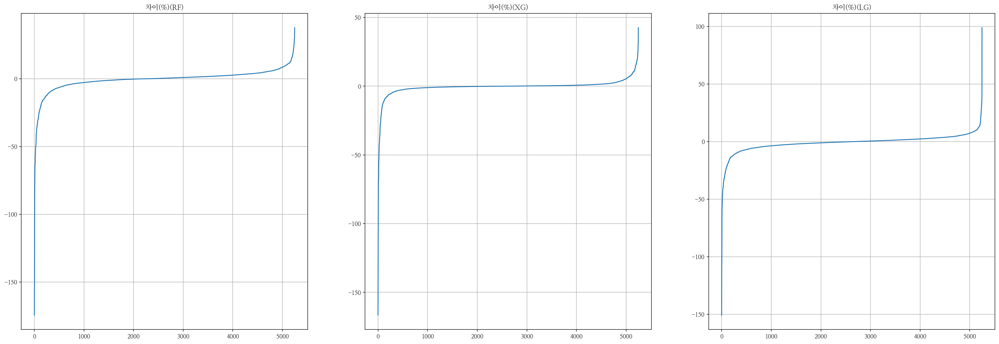

In [23]:
plt.figure(figsize=(30,10))
for i in range(3):
  plt.subplot(1,3,i+1)
  plt.title(df_pred.columns[i+7])
  df_pred.sort_values(df_pred.columns[i+7]).reset_index()[df_pred.columns[i+7]].plot()
plt.show()

### 3.3.2 예측 오차의 분포

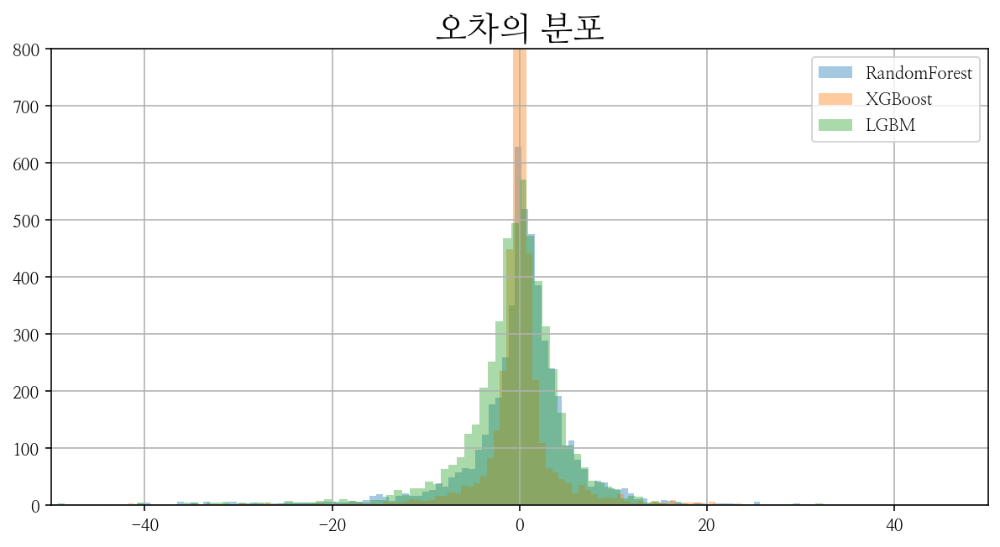

In [35]:
# plt.figure(figsize=(20,30))

plt.figure(figsize=(10,5))
plt.title("오차의 분포",fontsize=20)
plt.xlim(-50,50)
plt.ylim(0,800)
# plt.axvline(0,color='r',alpha=0.4,linewidth=5)
for i in range(3):
  df_pred[df_pred.columns[i+7]].hist(bins=300,alpha=0.4,label=['RandomForest','XGBoost','LGBM'][i])
plt.legend()
plt.show()

### 3.3.3 divide zone

<Figure size 720x720 with 0 Axes>

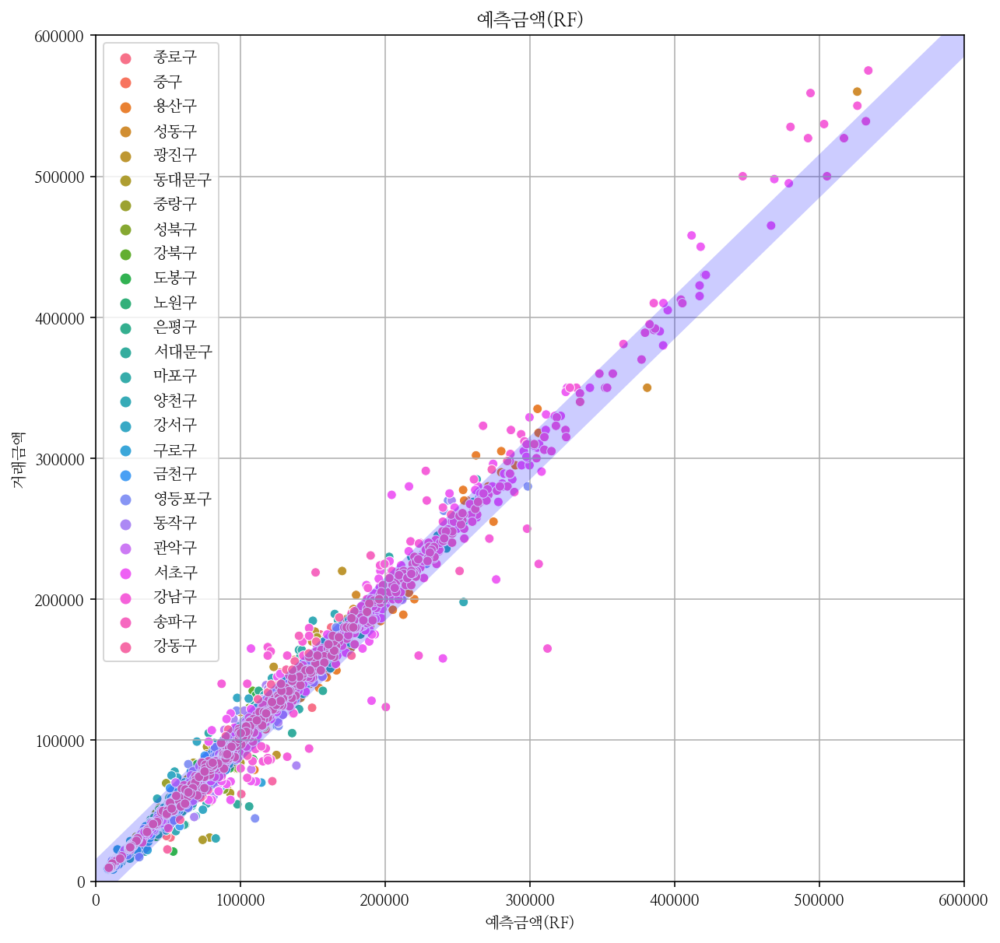

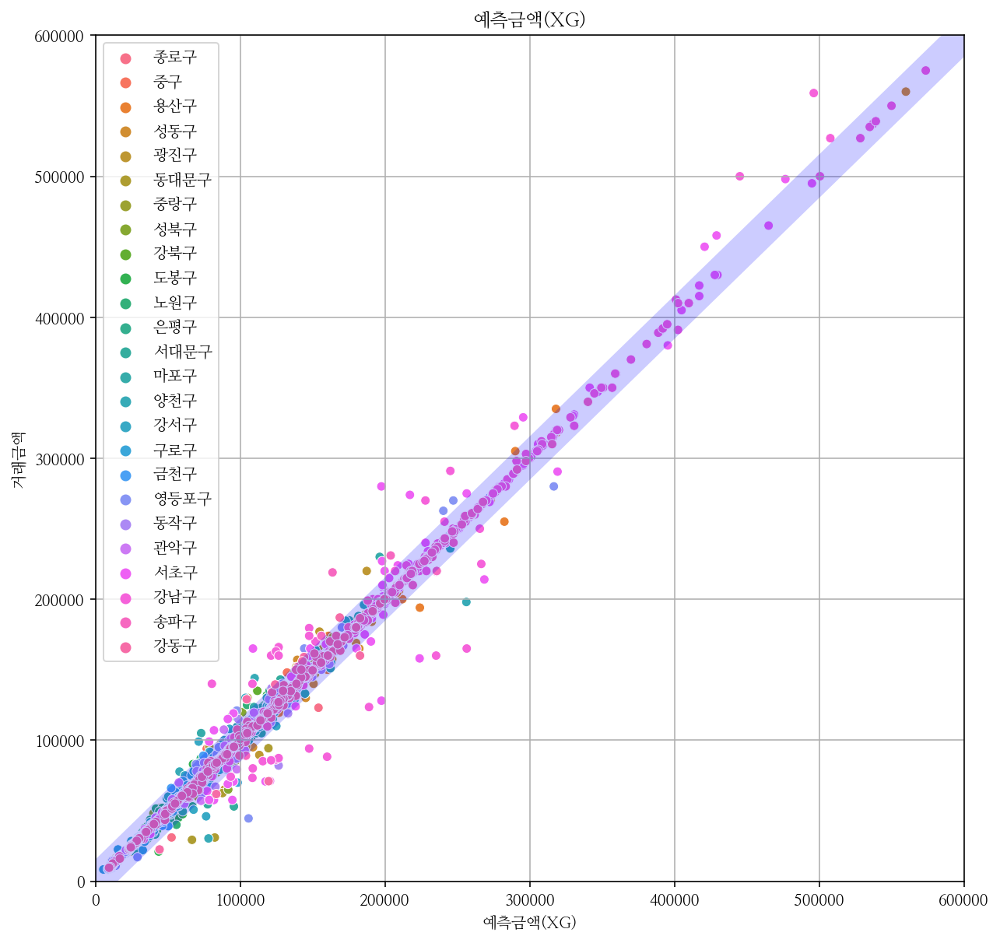

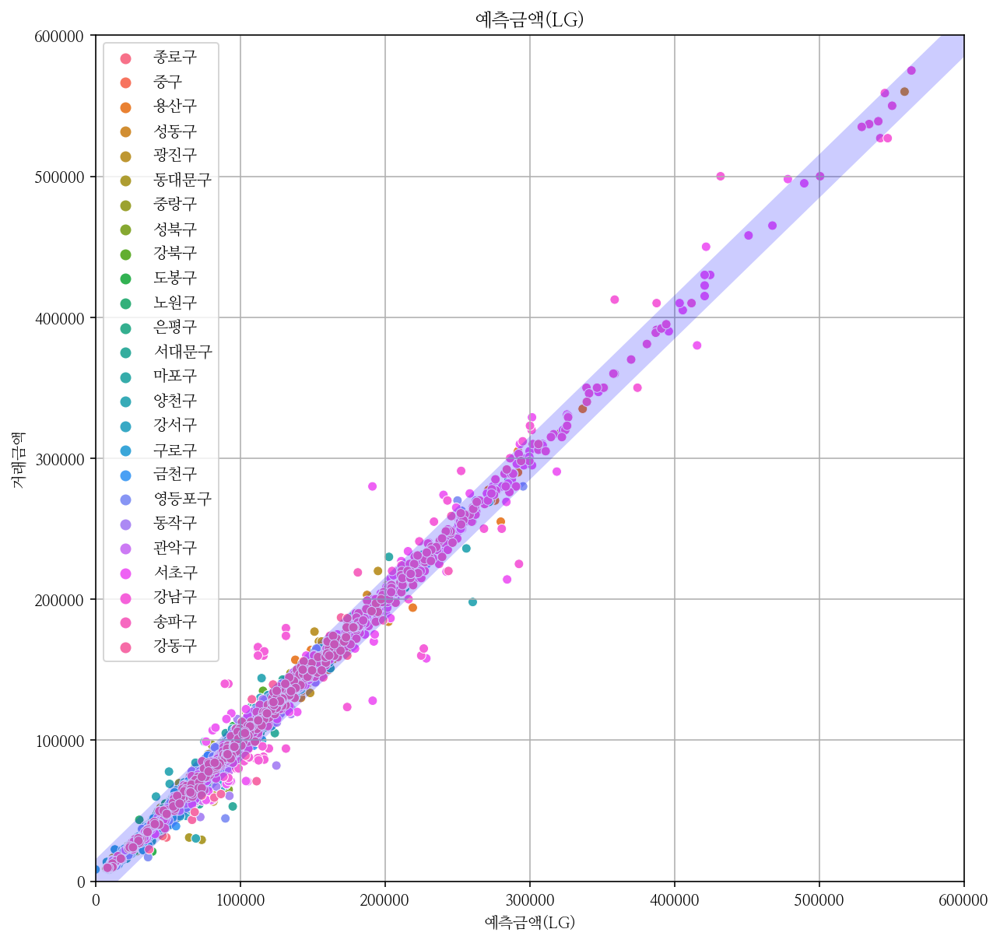

In [36]:
plt.figure(figsize=(10,10))

for i in range(3):
  plt.figure(figsize=(10,10))
  plt.title(df_pred.columns[i+1])
  plt.xlim(0,600000)
  plt.ylim(0,600000)
  sns.scatterplot(df_pred[df_pred.columns[i+1]], df_pred[df_pred.columns[0]],hue=df_pred.지역코드)
  sns.lineplot((0,600000),(0,600000),linewidth=20,color='b',alpha=0.2)
plt.show()

In [37]:
df_pred.to_csv('/content/drive/MyDrive/HOUSE_PRICE_PREDICTION/df_pred.csv')

In [39]:
import plotly.express as px

fig = px.scatter(df_pred, x="예측금액(XG)", y="거래금액",color="지역코드")
fig.update_layout(
    autosize=False,
    width=950,
    height=800,)
fig.show()

# 4. Interpretation

In [12]:
df_pred = pd.read_csv('/content/drive/MyDrive/HOUSE_PRICE_PREDICTION/df_pred.csv').iloc[:,1:]

## 4.1 Feature Importance (Randomforest)

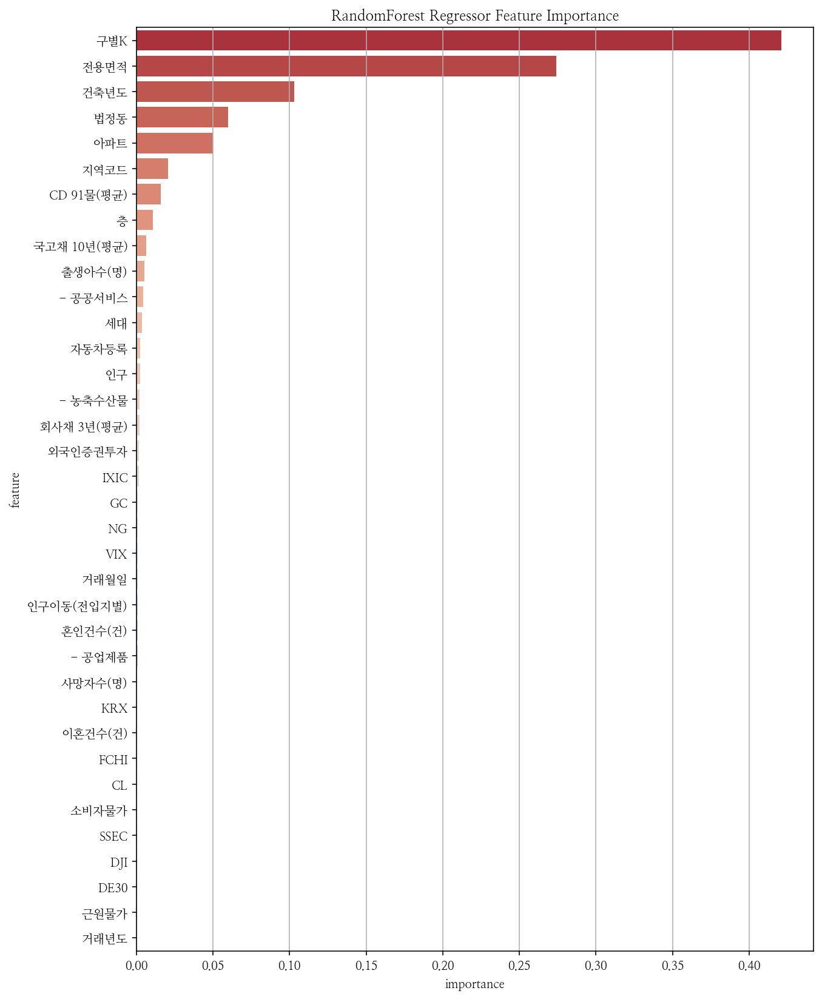

In [40]:
visvis = [[aa,bb] for aa,bb in zip(X_test.columns,rf.feature_importances_)]
df_visivs = pd.DataFrame(visvis,columns=['feature','importance']).sort_values('importance',ascending=False)
plt.figure(figsize=(10,14))
plt.title('RandomForest Regressor Feature Importance')
sns.barplot(df_visivs.importance,df_visivs.feature,orient='h',palette='coolwarm_r');

## 4.2 eli5 (xgboost)

In [ ]:
!pip install eli5
import eli5
from eli5.sklearn import PermutationImportance

In [ ]:

permuter = PermutationImportance(xg,
                                 n_iter=5,
                                 random_state=1
)

permuter.fit(X_test_encoded, y_test);

### 4.2.1 Permutation Importance

In [ ]:
feature_names = X_test_encoded.columns

In [49]:
eli5.show_weights(
    permuter, 
    top=None,
    feature_names=X_test_encoded.columns.to_list()
)

Weight,Feature
0.7338 ± 0.0338,전용면적
0.4296 ± 0.0288,구별K
0.2009 ± 0.0129,건축년도
0.0819 ± 0.0063,지역코드
0.0677 ± 0.0105,법정동
0.0446 ± 0.0082,아파트
0.0141 ± 0.0016,층
0.0004 ± 0.0003,거래월일
0.0004 ± 0.0002,CL
0.0004 ± 0.0001,GC


### 4.2.2 Barplot

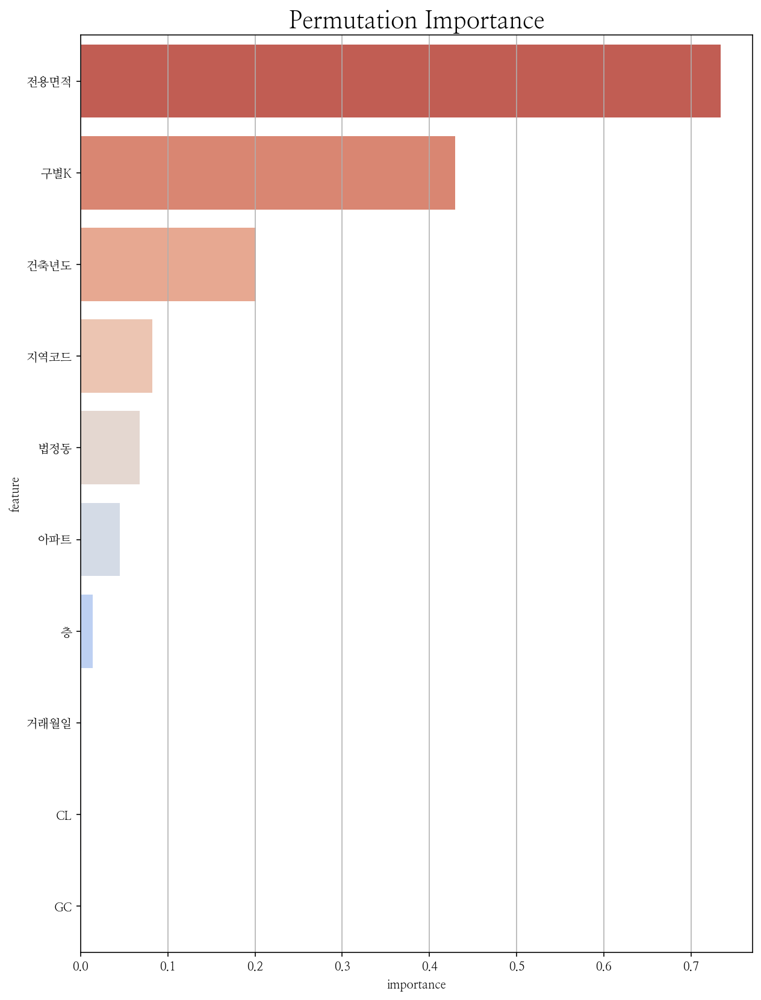

In [53]:
plt.figure(figsize=(10,14))
zipp  = []
for zipper in zip(X_train.columns, permuter.feature_importances_):
  zipp.append(zipper)
zipp = pd.DataFrame(zipp,columns=['feature','importance']).sort_values('importance',ascending=False)
sns.barplot(y = zipp.feature[:10], x= zipp.importance[:10], palette='coolwarm_r')
plt.title("Permutation Importance",fontsize=20)
plt.show()

## 4.3 PDP & Ice Curve (xgboost)

In [ ]:
!pip install pdpbox
from pdpbox.pdp import pdp_isolate, pdp_plot

### 4.3.1 전용면적

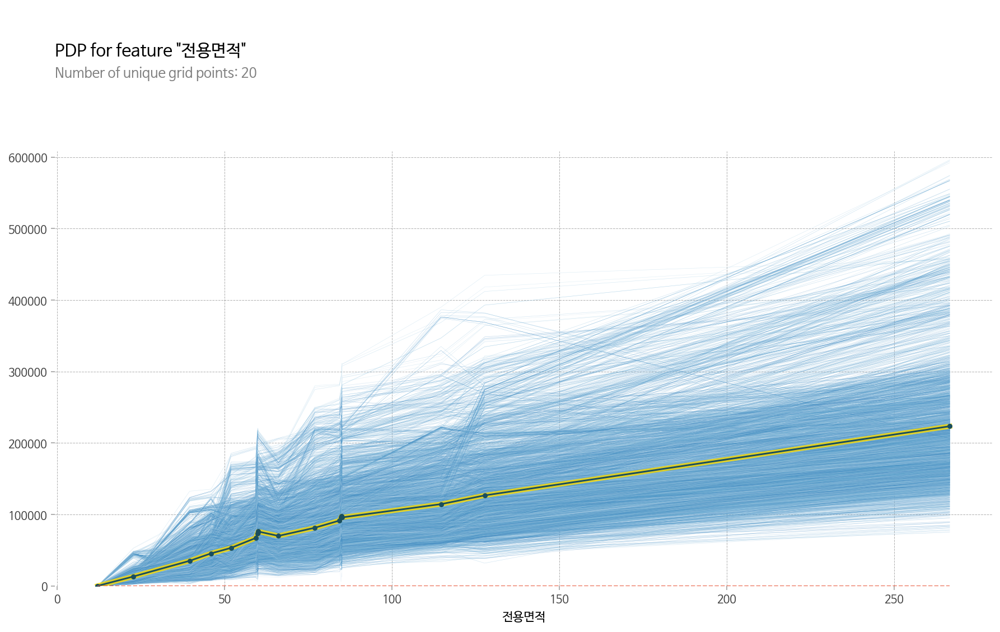

In [43]:
isolated = pdp_isolate(
  model=xgboost, 
  dataset=X_test_encoded, 
  model_features=X_test_encoded.columns, 
  feature='전용면적',
  grid_type='percentile',
  num_grid_points=20
)
pdp_plot(isolated, feature_name='전용면적',plot_params = {'font_family': 'NanumBarunGothic'},plot_lines=True);

### 4.3.2 건축년도

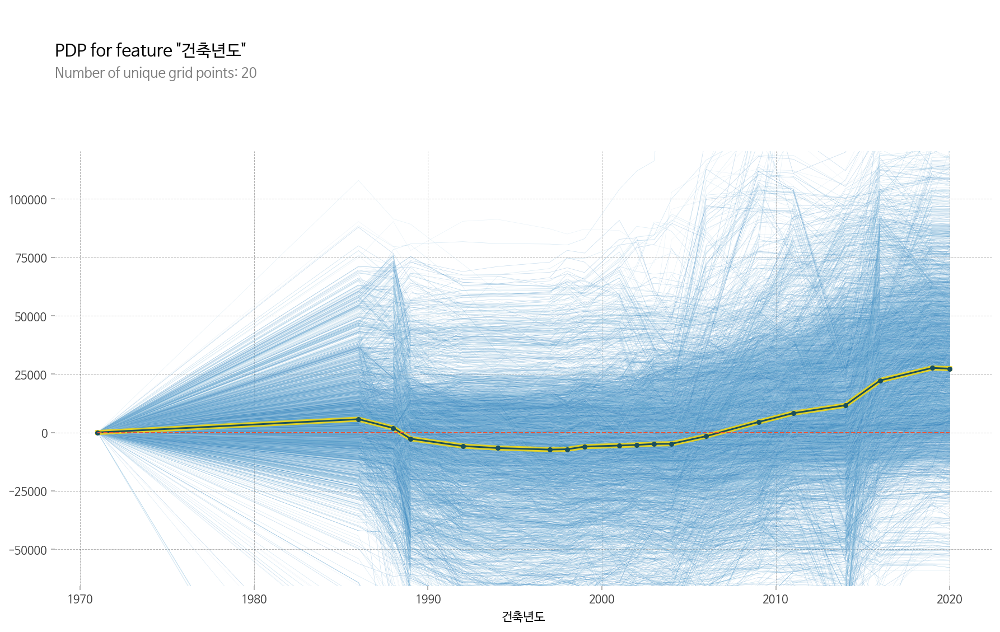

In [42]:
isolated = pdp_isolate(
  model=xgboost, 
  dataset=X_test_encoded[X_test_encoded.건축년도>1970], 
  model_features=X_test_encoded.columns, 
  feature='건축년도',
  grid_type='percentile',
  num_grid_points=20
)
pdp_plot(isolated, feature_name='건축년도',plot_params = {'font_family': 'NanumBarunGothic'},plot_lines=True);

### 4.3.3 CD 91물(평균)

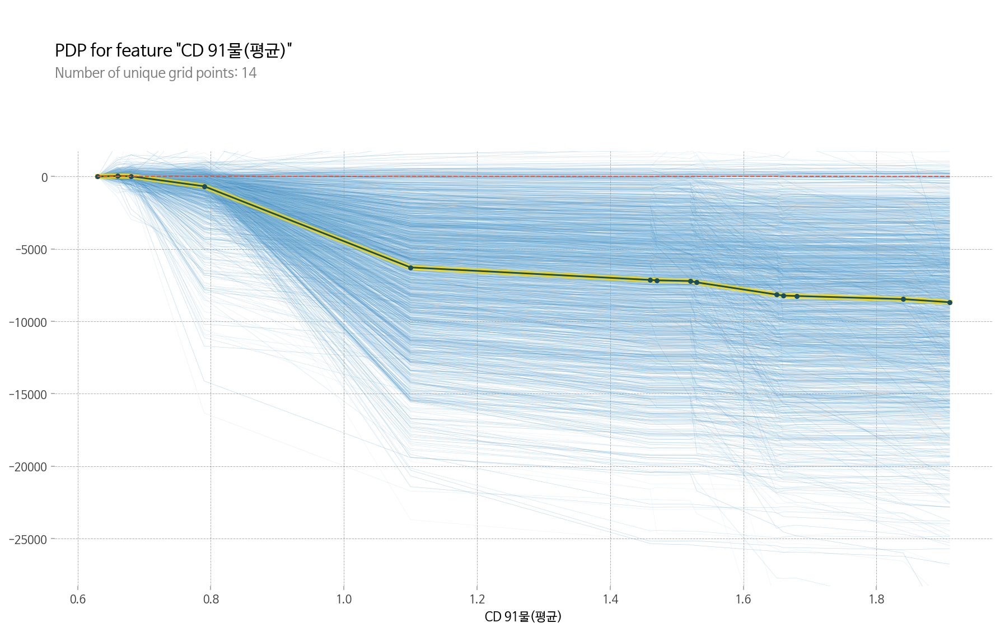

In [41]:
isolated = pdp_isolate(
  model=xgboost, 
  dataset=pd.concat([X_train_encoded,X_test_encoded]).sample(2000), 
  model_features=X_train_encoded.columns, 
  feature='CD 91물(평균)',
  grid_type='percentile',
  num_grid_points=20
)
pdp_plot(isolated, feature_name='CD 91물(평균)',plot_params = {'font_family': 'NanumBarunGothic'},plot_lines=True);

### 4.3.4 구별 K

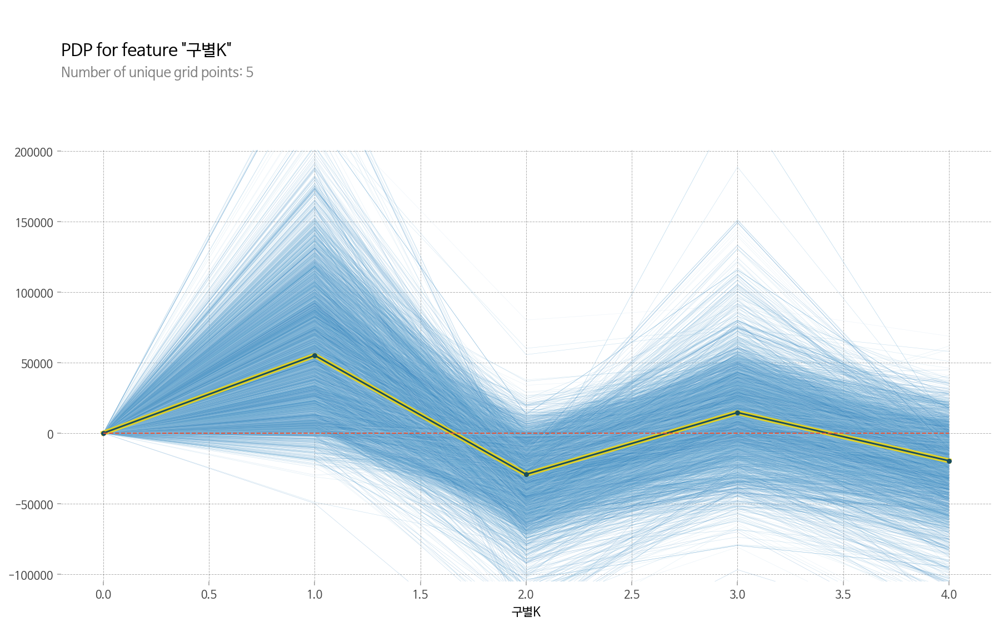

In [21]:
isolated = pdp_isolate(
  model=xgboost, 
  dataset=X_test_encoded, 
  model_features=X_test_encoded.columns, 
  feature='구별K',
  grid_type='percentile',
  num_grid_points=10
)
pdp_plot(isolated, feature_name='구별K',plot_params = {'font_family': 'NanumBarunGothic'},plot_lines=True);

## 4.4 Interact

### 4.4.1 전용면적, 건축년도

#### 2D

(<Figure size 1080x1080 with 3 Axes>,
 {'pdp_inter_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7fd6238f0310>,
  'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7fd5f76aab50>})

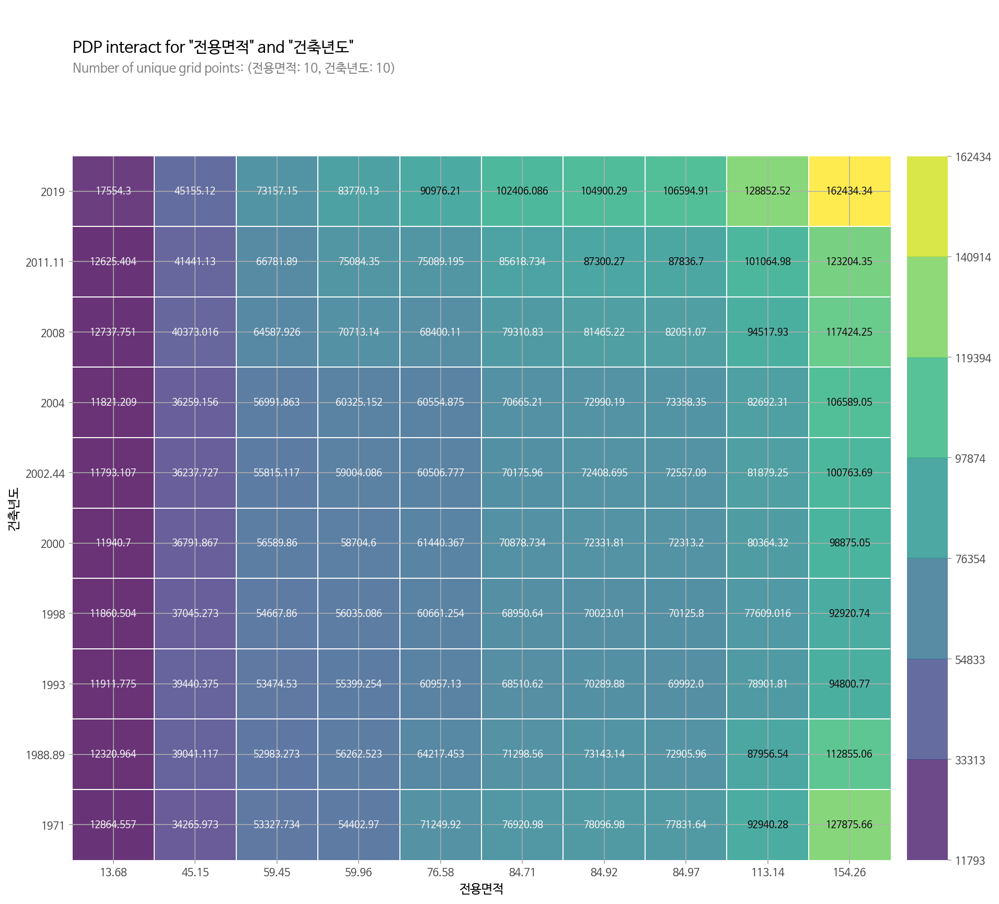

In [44]:
import random
from pdpbox.pdp import pdp_interact, pdp_interact_plot
randomnum = [random.randint(1,len(X_test_encoded)) for x in range(1,100)]
features = ['전용면적', '건축년도']

interaction = pdp_interact(
    model=xgboost, 
    dataset=X_val_encoded.iloc[randomnum],
    model_features=X_val_encoded.columns, 
    features=features
)
pdp_interact_plot(interaction, plot_type='grid',plot_params = {'font_family': 'NanumBarunGothic'}, 
                  feature_names=features,figsize = (15,15))

#### 3D (Matplotlib)

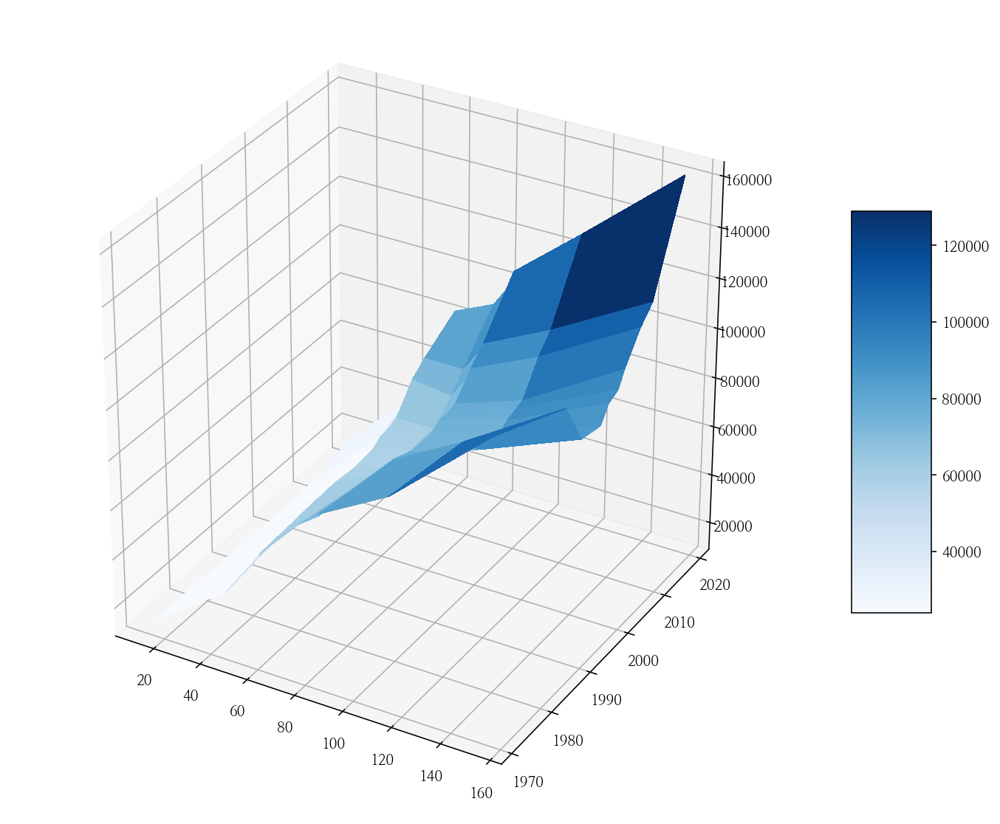

In [46]:
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator
import numpy as np
pdp = interaction.pdp.pivot_table(
    values='preds', 
    columns=features[0], 
    index=features[1]
)[::-1]


fig, ax = plt.subplots(subplot_kw={"projection": "3d"},figsize=(12,10))

X = pdp.columns
Y = pdp.index
Z = pdp.values
X, Y = np.meshgrid(X, Y)
surf = ax.plot_surface(X, Y, Z, cmap=cm.Blues,
                       linewidth=0, antialiased=False)

fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()

#### 3D (plotly)

In [47]:
# Interact in plotly
import plotly.graph_objs as go
surface = go.Surface(
    x=pdp.columns, 
    y=pdp.index, 
    z=pdp.values
)

layout = go.Layout(
    scene=dict(
        xaxis=dict(title=features[0]), 
        yaxis=dict(title=features[1]), 
        zaxis=dict(title=target)
    )
)

fig = go.Figure(surface, layout)
fig.show()

### 4.4.2 전용면적, 구별 K

#### 2D

(<Figure size 1080x1080 with 3 Axes>,
 {'pdp_inter_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7fd62389fed0>,
  'title_ax': <matplotlib.axes._subplots.AxesSubplot at 0x7fd66794a1d0>})

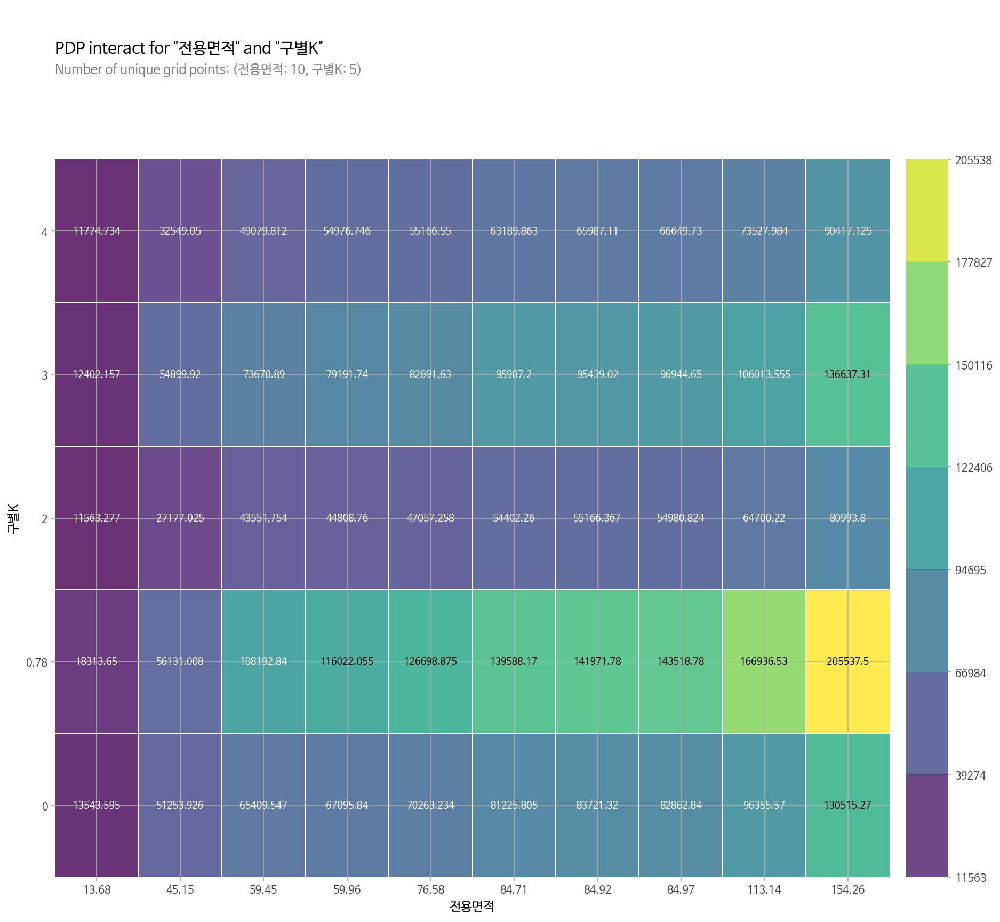

In [48]:
features = ['전용면적', '구별K']

interaction = pdp_interact(
    model=xgboost, 
    dataset=X_val_encoded.iloc[randomnum],
    model_features=X_val_encoded.columns, 
    features=features
)
pdp_interact_plot(interaction, plot_type='grid',plot_params = {'font_family': 'NanumBarunGothic'}, 
                  feature_names=features,figsize = (15,15))

#### 3D (Matplotlib)

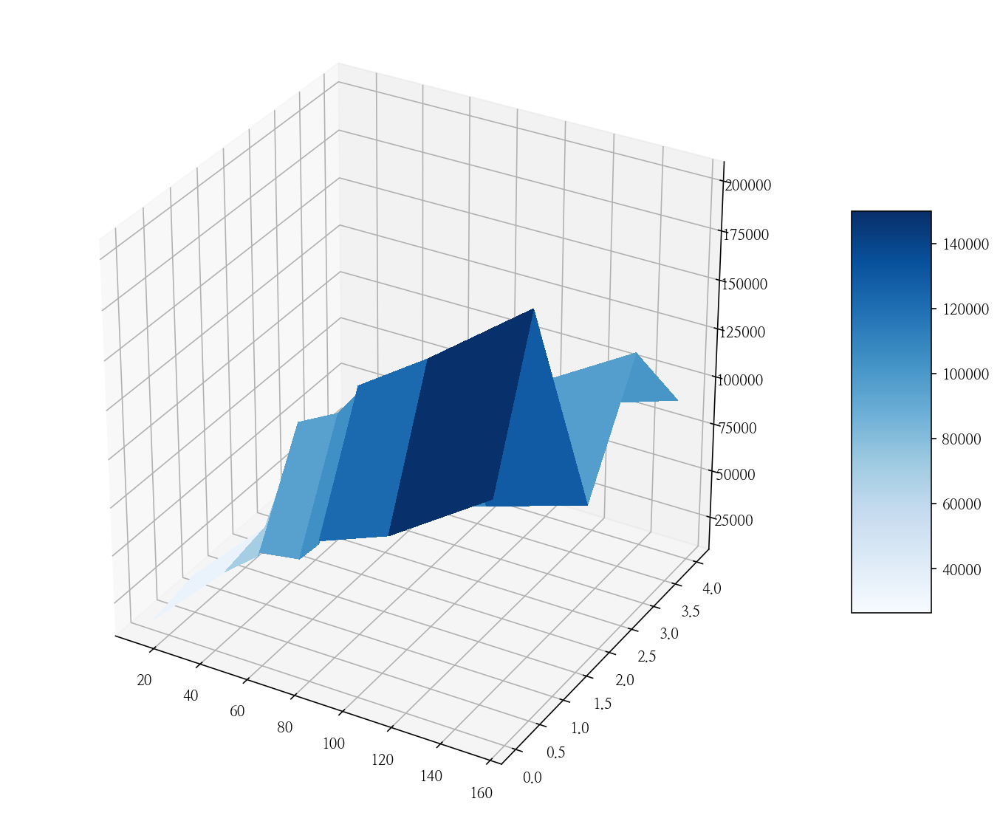

In [49]:

pdp = interaction.pdp.pivot_table(
    values='preds', 
    columns=features[0], 
    index=features[1]
)[::-1]


fig, ax = plt.subplots(subplot_kw={"projection": "3d"},figsize=(12,10))

X = pdp.columns
Y = pdp.index
Z = pdp.values
X, Y = np.meshgrid(X, Y)
surf = ax.plot_surface(X, Y, Z, cmap=cm.Blues,
                       linewidth=0, antialiased=False)

fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()

#### 3D (plotly)

In [50]:
surface = go.Surface(
    x=pdp.columns, 
    y=pdp.index, 
    z=pdp.values
)

layout = go.Layout(
    scene=dict(
        xaxis=dict(title=features[0]), 
        yaxis=dict(title=features[1]), 
        zaxis=dict(title=target)
    )
)

fig = go.Figure(surface, layout)
fig.show()

## 4.3 shap

In [64]:
import shap
explainer = shap.TreeExplainer(xgboost, data=shap.sample(X_test_encoded, 100), feature_perturbation='interventional')

In [65]:
row = X_test_encoded.iloc[randomnum]
shap_values = explainer.shap_values(row)
visvis = [[aa,bb] for aa,bb in zip(X_test.columns,shap_values.copy().astype(int)[0])]
df_visivs = pd.DataFrame(visvis,columns=['feature','importance']).sort_values('importance',ascending=False)

 99%|===================| 98/99 [04:15<00:02]       

### 4.3.1 force plot

In [67]:
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values,
    features=X_test_encoded.columns
)

### 4.3.2 Summary plot

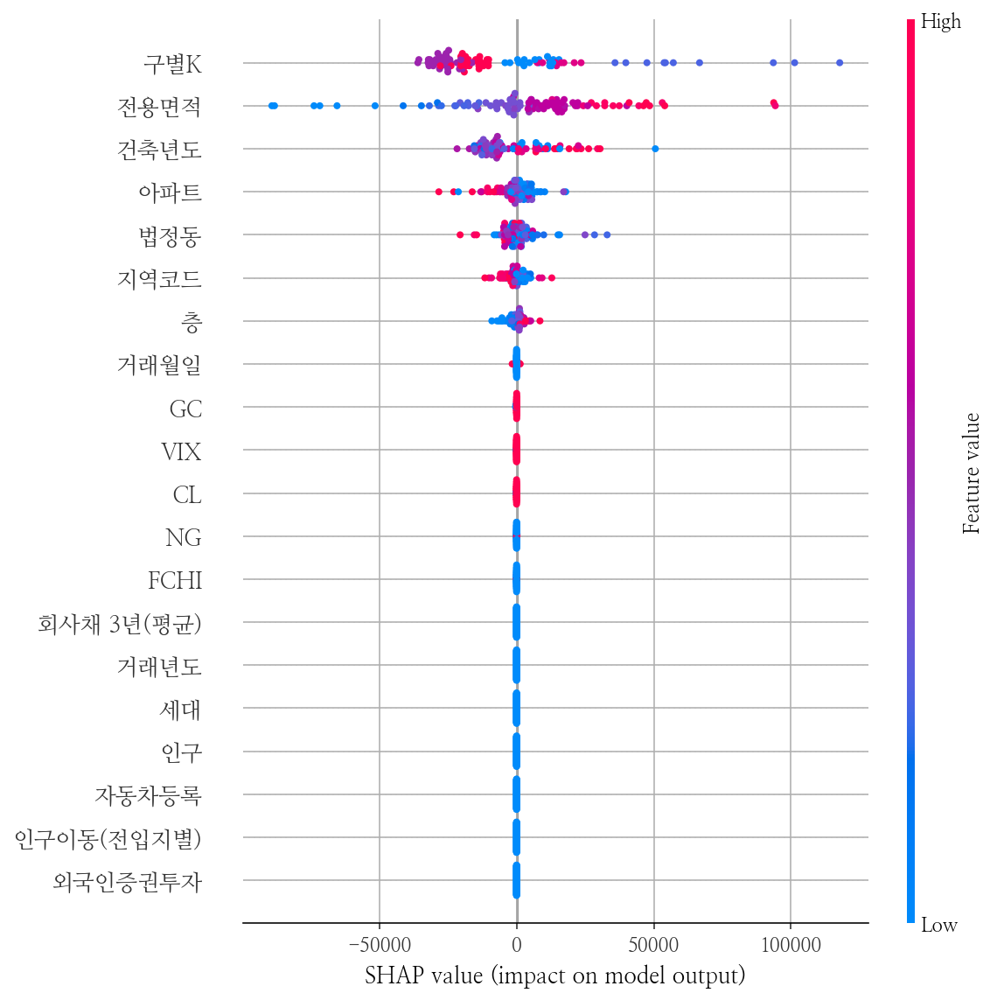

In [70]:
shap.summary_plot(shap_values,row)

### 4.5.3 Barplot

 99%|===================| 98/99 [04:09<00:02]       

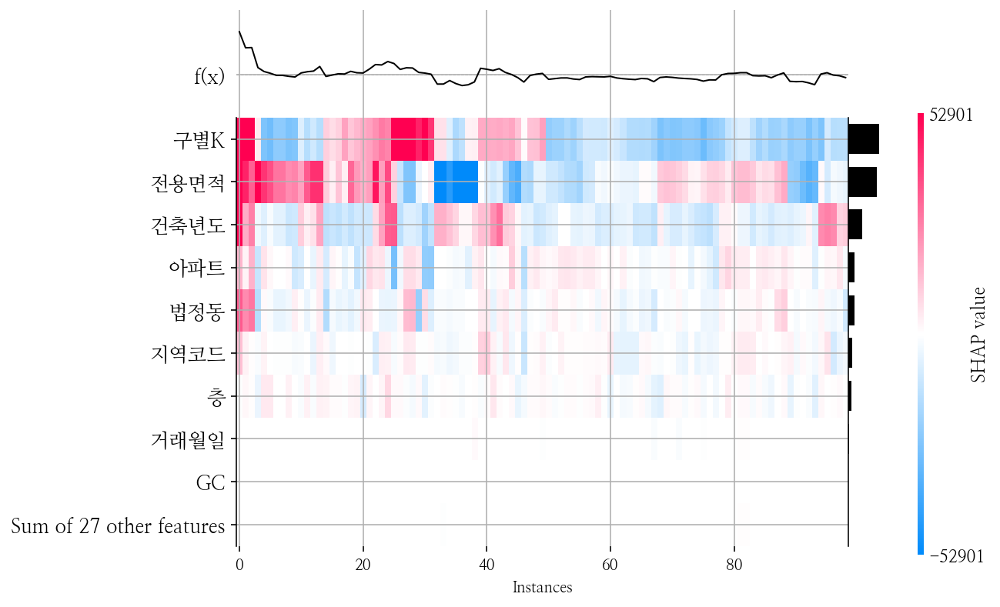

In [75]:
explainer2 = shap.Explainer(xgboost, row)
shap_values2 = explainer2(row)
shap.plots.heatmap(shap_values2)

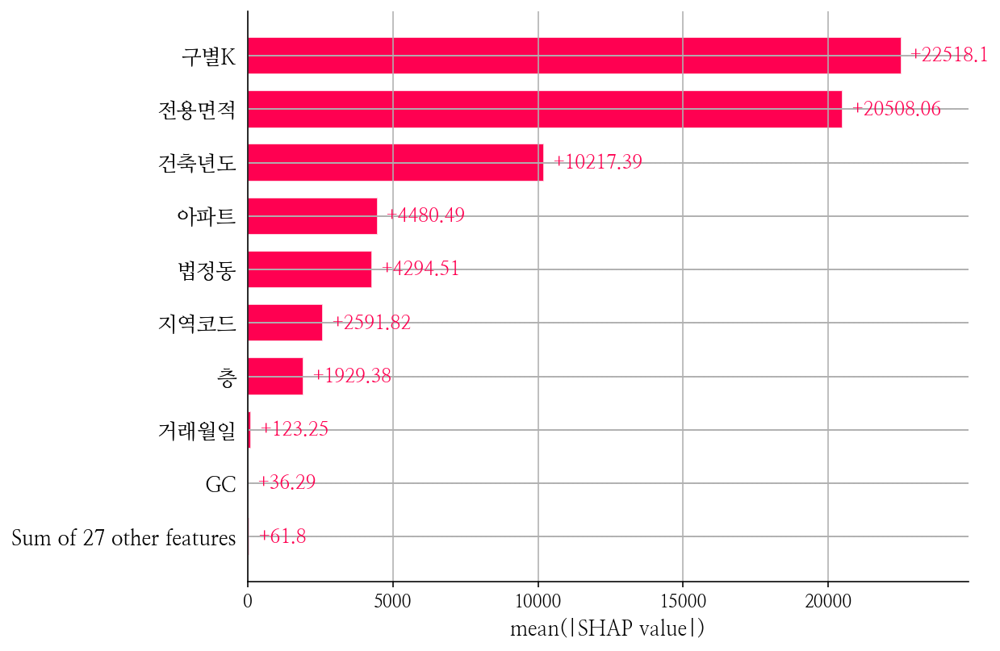

In [76]:
shap.plots.bar(shap_values2)